# Dodge Data Analysis - 5min PV


### **Introduction**
The goal of this analysis is to identify ‘anomalies’ in the power generation data (i.e. points where the system is not pulling the correct data).

In order to identify these points three methods were used, i) a visual exploration of the data ii) functions that will detect unusual points and iii) a machine learning solution. These three methods will be discussed in more detail in the sections below.

In [ ]:
!pip install vaex
!pip install --upgrade vaex
!pip install dash
!pip install rtree 
!pip install pygeos

!pip install river
!pip install geopandas

!pip install -U matplotlib
!pip install statsmodels --upgrade

!pip install category_encoders

In [1]:
# Have to restart runtime for this to work
import vaex as vx
import pandas as pd
import numpy as np
import xarray as xr
import geopandas as gpd

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from datetime import datetime
from datetime import time

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from sklearn.neighbors import BallTree
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.ensemble import BaggingRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_validate, GridSearchCV
from statsmodels.tsa.seasonal import STL

from sklearn.metrics import mean_absolute_percentage_error
import category_encoders as ce

/usr/local/lib/python3.8/dist-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
<ipython-input-1-d8848780f8a2>:6: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  impo

### **The Data**
The Following datasets were used for the analysis:

**5min parquet**: Time series data of PV solar generation data. Available: https://huggingface.co/datasets/openclimatefix/uk_pv/tree/main. For information about the data read more here https://huggingface.co/datasets/openclimatefix/uk_pv

**metadata**: Metadata of the different PV systems. Available: https://huggingface.co/datasets/openclimatefix/uk_pv/tree/main. Read more here https://huggingface.co/datasets/openclimatefix/uk_pv

**5min sample**: The steps taken to create the dataframe are outlined in "Part 3:Machine Learning" below.


In [ ]:
# Load Datasets
min5= vx.open('/content/5min.parquet')   # 5 min data
metadata_vaex= vx.open('metadata.csv') # Metadata vaex

# Decomposing date
min5['day'],min5['month'],min5['year'] = min5.timestamp.dt.day, min5.timestamp.dt.month,min5.timestamp.dt.year,
min5['hour'],min5['minute'] = min5.timestamp.dt.hour,  min5.timestamp.dt.minute
min5['date'] = min5.timestamp.dt.date

# Converting datetime to string for easyer processing
min5['time'] = min5.hour.astype(str)+ ':'+ min5.minute.astype(str) 
min5['year_month_day'] = min5.year.astype(str) + '-' + min5.month.astype(str) + '-' + min5.day.astype(str)

-----------------
# **PART 1: Visual Exploration**

### **Functions**

Two functions are defined below, the first should be used to prepare  the data (this should be run with 'min5' data defined above), while the second should be used for graphing. 




In [ ]:
 # Function for preparing the data 

 def month_select(data, year, Single_month):
  'for selecting a year and month and making sure the datetime columns are formated correctly'
  # Select year
  min5_year = data[data['year']==year]
  # Select months
  months = min5_year[min5_year['month'] == Single_month]
  months = months.to_pandas_df()
  # Convert timestamp to datetime
  months['timestamp']= [datetime.strptime(x, '%H:%M').time() for x in months.time]
  months['Date']= [datetime.strptime(a,'%Y-%m-%d').date() for a in months.year_month_day]
  
  return months

# Function for graphing with an animation
def graph_OneDay_animation(data, y_m_d):
  'for graphine ss_id, power generated and time for a specific one day in a specified year'
  # preparing data
  oneday_data = data[data.year_month_day == y_m_d ].sort_values(['Date','timestamp'], ascending=[True,True])

  #plotting
  fig = px.scatter(oneday_data, x=oneday_data.timestamp.astype('str'), y="generation_wh", color="ss_id",
                title= ("Power Generated throughout the day on " + y_m_d ),
                animation_frame= 'ss_id',width=1000,height=800)

    # update style
  fig.update_layout(autosize=False, showlegend=False)
  fig.update_layout({'xaxis': {'tickangle': 45, 'nticks': 24}})
  fig.update_layout(yaxis_range=[-1,250])
  fig.update_layout(autotypenumbers='convert types')
  return fig.show()

This part of the analysis focuses on the year 2021. One day from each month was selected (January - November) and power generated over the day was graphed using the following the procedure:
1.   Select only relevant data to speed up processing time (Min5_select)
2.   Run through the first function (month_select) to only select specific months
3.  Run through the second function (graph_OneDay_animation) to produce a graph for visual inspection

An animation frame was used on ss_id to assess each system separately and any unusual activity was noted. Unusual ss_ids were sorted into the following 3 main categories; 

1. None = No power was generated during the selected day 
2. Missing_values = The data is graphed in a 24 hour period. Most pv systems have datapoints for every 5 minute increment over a day (e.g. data for power generated at 1:00, 1:05, 1:10 etc.). The pv systems listed here have missing data points, for example, the data begins at 8:00 am instead of at 0:00. 
3. Atypical = The pv systems listed here are unusual in some way. For example, there are odd peaks, the data falls off sharply, etc. The distribution of power generated is strange in comparison to the rest of the pv systems.





**Steps to preforme the analysis**

Step 1: Select only some columns from min5 to speed up processing time in the step below


In [ ]:
# Select only some columns from min5 to speed up processing time in the step below
min5_select = min5[['year','month','generation_wh','ss_id','time','year_month_day']]

Step 2: Running throught first function, this will yield a dataframe for a specific year and month


In [ ]:
# Running through first function, this will yield a dataframe for a specific year and a range of months
df_out = month_select(min5_select, 2021,9)
df_out.head(2)

Step 3: Run through the second function plotting power generated throughout the day. The animation frame can be used to view each ss_id separately.


In [ ]:
# Run through the second function plotting power generated throughout the day by ss_id
graph_OneDay_animation(df_out, '2021-9-30')

### **Results**

**Jan 1 2022**

***None***=3147, 6329, 6597, 7451, 18873, 26828, 2607, 3249, 6126, 6364, 6597, 6732, 7239, 7285, 7356, 7395,
7401, 7409, 7402, 7464, 7473, 7548, 7569, 8587, 11494, 11895, 12761, 13311, 15825, 26800, 26828, 26826,
26831, 26890, 26900

***Missing_values*** = 2815, 6938, 16364, 26780, 26792, 3263, 3437, 12847, 8175, 3811, 2760, 7050, 26994, 2855,
15721

***Atypical*** = 7387 , 2775, 3258, 6990, 7061, 7119, 7255, 7498, 7534, 7644, 7759, 7830, 26903, 27017, 27024,
27034

**NOTES**:
  - 6990 only has 2 data points
  - 7061 & 7534 only one data point
  - 7759, 7830, 2760 stand out as wrong
----------------------

**Feb 23**

***None***=3117, 3249, 4238, 6126, 6329, 6596, 7239, 7356, 7401, 7766, 8587, 13311, 16298, 18873, 26800, 2706,
Missing_values =2903, 3453, 8684, 10511, 17062, 2855, 4002, 2815, 26994, 7050, 27042, 6798

***Atypical***=2881, 3311, 3437, 5895, 6573, 6576, 6577, 6732, 7061, 7119, 7387, 7664, 7759, 7830, 27041,

**Notes**:
  - 7664 only has 3 data points
  - 7759, 7830 stand out as wrong
--------------------------------

**March**

***None*** =2607, 3117, 3249, 4238, 7766, 8587, 18873, 26800, 27062

***Missing_values*** = 3258, 3453, 3543, 6433, 7595, 7660, 8175, 8801, 10168, 26959, 2578, 3437, 6576, 6798,
7176, 7830, 10843, 16770, 2903, 7759, 27053, 2855, 7050, 4476, 7528, 27048

***Atypical***=5895, 7119, 7569, 7644, 13012, 62875t, 26927, 27034

**Notes**:
- 62875only has 1 data point
- 5895, 7759, 27053, 2855, 7050, 4476, 7528, 27048 stand out as wrong
-------------------------------------

**April 26**

***None***=3249, 6576, 10702, 26800, 27062,

***Missing_values*** =9366, 26991, 5265, 6601, 6638, 7648, 7759, 7830, 9763, 26927, 7776, 6641, 26994, 7050,
2855,

***Atypical*** =5895, 6571, 6798, 6938, 7401, 7644, 8266, 9903, 10630, 1338, 76812, 26835

**Notes**:
  - 6571 only has 1 data point
  - 6798, 5265, 7759, 7830, 26994, 7050, 2855 stand out as wrong

--------------------------------------
**May 17**

***None***=3249, 6576, 7766, 10585, 10838, 26800, 26845, 27062,

***Missing_values***=3288, 3442, 2822, 2824, 3811 -23, 5974, 6838, 6672, 6966, 8175, 26927, 26817, 17878, 9531,
7050, 7234, 26799, 27029

***Atypical*** =5265, 5890, 5895, 6938, 7395, 7700, 7759, 7830, 27031,

**Notes**:
  - 6571 only has 1 data point
  - 17878, 9531, 7050, 7234, 26799, 27029 stand out as wrong
-----------------------------
**June 30**

***None***=3249, 6633, 6672, 7766, 7928, 10585, 10702, 10838, 26800, 27062,

***Missing_values*** =2855, 3262, 12371, 14453, 14757, 9531, 2775, 12495, 7050, 26799, 3442,5265, 5895, 7176,
7830, 8175, 26927, 26994, 2813

***Atypical*** =7759, 8266, 27042,

**Notes**:
  - 6571 only has 1 data point
  - 26799, 7759, 7830, 8175, 26927, 26994, 2813 stand out as wrong
-------------------------------------

**July 24**

***None***=6633, 7568, 7766, 10585, 10838, 13767, 26800, 27062

***Atypical*** =5895, 6011, 7061, 16289

***Missing***=2813, 2815, 3453, 6427, 8175, 8266, 26780, 26829, 26856, 26981, 3513, 6961, 7176, 7395, 7758,
7830, 27015, 27042, 3487, 26848, 12495, 3263, 7050, 2903, 26994, 2855

**Notes**:
  - 6571 only has 1 data point
  - 3513, 7758, 7830 stand out as wrong
---------------------------------------

**Aug 10**

***None***=6633, 6938, 7568, 7648, 7766, 10585, 10702, 10838, 26800, 26924, 27062

***Atypical***=3074, 6640, 7149, 7402, 8266, 13311, 26972, 27007,5265, 5895, 7473, 7521, 7759, 7830

***Missing***=2903, 3016, 3235, 3263, 6672, 6817, 8175, 10975, 27054, 26909, 7050, 27053, 7547, 26799,
6729, 23083, 7287, 26780, 26994, 2855

**Notes**:
- 5265, 5895, 7473, 7521, 7759, 7830 stand out as wrong
-------------------------------------

**Sept 29**:

***None***:4114, 6633, 6938, 7648, 7766, 8266m 10585, 10929, 26800, 26924, 27062

***Missing***: 5908, 6862, 6958, 7061, 8175, 8464, 26905, 26909, 26912, 26958, 26963, 26964, 26967,
26992, 2813, 2912, 7693, 26799, 6504, 6667, 6672, 5900, 7050, 27036, 26910, 26994, 2822, 17333, 26925

***Atypical*** : 6577, 7315, 7473, 10702, 10838, 3437, 5895, 7176, 5265, 7521, 7759, 7830, 26927

**Notes**:
  - 7473 generates 2 points at night
  - 7759, 7830 stand out as wrong
---------------------------------------

**Oct 16**

***None***: 4114, 6938, 7402, 26800, 26806, 26958, 26986, 27062

***Missing***: 2813, 2855, 2903, 6672, 10585, 10702, 10929, 16267, 26780, 26959, 26964, 26994, 27036,
26799, 6380, 7050, 23083, 6575,

***Atypical*** : 5895, 6364, 7338, 7473, 7557, 7569, 7759, 7830, 26927,

**Notes**:
- 7338 only generated 2 points
- 7473 generated strange points
- 7759, 7830 stand out as wrong
-------------------------------------

**Nov 5**

***None***: 4114, 6938, 7356, 10585, 10929, 26800, 26806, 26900, 26924, 26958, 26986, 27062,

***Missing***: 2813, 7149, 7163, 7255, 7259, 7410, 7865, 26776, 26780, 26781, 26901, 26903, 27037, 27036,
3487, 27065, 27066, 27036, 6504, 27048, 26909, 26959, 7050, 27042, 27057, 26994,

***Atypical*** : 3437, 5895, 6683, 7401, 7402, 7473, 7759, 7830, 8453, 8801, 27034, 16364

**Notes**:
  - 3437 generated unexpected spikes
  - 7401 only generated 2 point
  - 7402 only generated 3 point
  - 8801 only generated 1 point
  - 7759*, 7830*,16364 stand out as wrong

# **PART 2: Automated Value Detection**

While graphing is useful for discovering trends in the data and identifying obvious incorrect points, it is a time consuming approach, and more subtle anomalies can be missed. For example, if a pv system is generating data only 10 points of data in a day it is easily identifiable. However, if it is missing only 10 points of data it is less obvious.

Therefore, this section will use functions to identify pv systems with missing values and pv systems that are generating power during the night.

i)	**Missing values**:
A function was created to identify missing values. There are several pv systems that do not pull data for the full time period (time in 5 min chunks should equal 288 data points in one day) but several do not. 

ii)	**Generating at night**:
A function was created to identify pv systems that were pulling data at night (before or after sun set).

### **Missing values**

In [ ]:
def missing_values_check(data, number_of_expected_entries):
  missing = []
  for singleDay in data.year_month_day.unique():
    single_day_df = data[data.year_month_day== singleDay].reset_index()
    for unique_ssid in single_day_df.ss_id.unique():
      check = single_day_df[single_day_df.ss_id == unique_ssid].reset_index()
      if len(check.generation_wh) < number_of_expected_entries:
        a= unique_ssid.astype('str')
        b= check['year_month_day'][0]
        missing.append(a + "," + b)
      else:
        pass

  return missing

In [ ]:
# Select only some columns from min5 to speed up processing time in the step below
min5_select = min5[['year','month','generation_wh','ss_id','time','year_month_day']]

# Run through the month_select function
min5_year_month = month_select(min5_select,2021,8)

# Run through the missing values check function to find the missing values
missing_values = missing_values_check(min5_year_month,288)

A dataframe is presented below which lists the pv systems that contain missing values. This can be used for future analysis.

In [ ]:
# missing values to dataframe
missing_ssid = pd.DataFrame(missing_values, columns =['Name'])
missing_ssid[['ss_id', 'date']] = missing_ssid['Name'].str.split(',', expand=True)
missing_ssid = missing_ssid.drop('Name',axis=1)
missing_ssid.head(5)

,ss_id,date
0,7033,2021-8-15
1,6872,2021-8-15
2,10595,2021-8-11
3,15359,2021-8-6
4,27020,2021-8-21


## **Generating at night**

In [ ]:
# Select only some columns from min5 to speed up processing time in the step below
min5_select2 = min5[['year','month','generation_wh','ss_id','time','year_month_day']]
min5_select2 = min5_select2.to_pandas_df()

In [ ]:
# Create a dataframe to store the sunrise and sunset times by month in the uk
sun_rise_set = pd.DataFrame({'month':[1,2,3,4,5,6,7,8,9,10,11,12],
                             'sun_rise':['7:57','7:12','6:13','6:03','5:06','4:40','4:58','5:44','6:33','7:22','7:16','7:57'],
                             'sun_set':['16:22','17:16','18:05','19:58','20:47','21:21','21:14','20:26','19:18','18:10','16:13','15:53']
                             })

In [ ]:
# Merge sunrise and sunset data with the min5 select dataframe
combined = min5_select2.merge(sun_rise_set, left_on='month', right_on='month', how='left')

# Convert time columns to datetime
combined['sun_rise']= [datetime.strptime(x, '%H:%M').time() for x in combined.sun_rise]
combined['sun_set']= [datetime.strptime(a,'%H:%M').time() for a in combined.sun_set]
combined['time']= [datetime.strptime(a,'%H:%M').time() for a in combined.time]

# Create indicator columns that will indicate weather the pv systems are generating before or after sunrise/sunset
combined['gen_before_sunrise'] = 'False'
combined['gen_before_sunrise'] = np.where(((combined['time']<combined['sun_rise'])&(combined['generation_wh']>0)),'True', combined['gen_before_sunrise'])
combined['gen_after_sunset'] = 'False'
combined['gen_after_sunset'] = np.where(((combined['time']>combined['sun_set'])&(combined['generation_wh']>0)),'True', combined['gen_after_sunset'])

As seen in the visualizations below, PV system generally do not pull data after sun set (figure 2.1). However, there are many instances of pv systems generating before sunrise (figure 2.2).

In [ ]:
# Preparing the data for plotting
# Calculating the number of pv systems that generate after sunset
After_Sunset = combined['gen_after_sunset'].value_counts().reset_index()
# Adding data for 'true'
After_Sunset2 = pd.DataFrame({'index':'True', 'gen_after_sunset':[0]})
# Appending dataframe
After_Sunset = After_Sunset.append(After_Sunset2).rename(columns={'gen_after_sunset':'Count',
                                                                  'index':'gen_after_sunset'})

After_Sunset['after_sunset'] = 'after_sunset' # This is a category that will allow for easily plotting the stacked bar chart with plotty 

# Plotting
fig121 = px.bar(After_Sunset,x='Count' ,y ='after_sunset',color="gen_after_sunset", 
                color_discrete_sequence=["lightgreen", "#CB4335"],
                orientation = 'h', width=700, height=250,
                title="Figure 2.1: Count of Pv systems generating after sunset")
fig121.update_yaxes(title='y', visible=False, showticklabels=False)
fig121.update_layout(autosize=True, showlegend=False, plot_bgcolor='#ffffff')
fig121.update_layout(showlegend=True)
fig121.show()

In [ ]:
# Preparing the data for plotting
Before_Sunrise = combined['gen_before_sunrise'].value_counts().reset_index().rename(columns={'gen_before_sunrise':'Count',
                                                                                             'index':'gen_before_sunrise'})

Before_Sunrise['Before_Sunrise'] = 'Before_Sunrise' # This is a category that will allow for easily plotting the stacked bar chart with plotty 

# Plotting
fig121 = px.bar(Before_Sunrise,x='Count' ,y ='Before_Sunrise',color="gen_before_sunrise", 
                color_discrete_sequence=["lightgreen", "#CB4335"],
                orientation = 'h', width=700, height=250,
                title="Figure 2.2: Count of generating before sunset")
fig121.update_yaxes(title='y', visible=False, showticklabels=False)
fig121.update_layout(autosize=True, showlegend=False, plot_bgcolor='#ffffff')
fig121.update_layout(showlegend=True)
fig121.show()

Next, a dataframe for pv systems that generate power before the sunrise and a dataframe for systems that generate power after sunset will be presented. These can be used for future analysis.

The following pv systems generate power before sunrise:

In [ ]:
# Dataframe for pv systems generating before sunrise
select_gen_before_sunrise = combined[combined.gen_before_sunrise=='True']
# List ss_id's that generate before sunrise
select_gen_before_sunrise.ss_id.value_counts().reset_index()

,index,ss_id
0,5428,1
1,26934,1
2,9870,1
3,26951,1
4,7190,1
5,26835,1
6,2813,1
7,7642,1
8,13570,1
9,8648,1


The following pv systems generate power after sunset:

In [ ]:
# Dataframe for pv systems generating after sunset
select_gen_after_sunset= combined[combined.gen_after_sunset=='True']
# List of pv systems generating after sunset
select_gen_after_sunset.ss_id.value_counts().reset_index()

,index,ss_id
0,6846,1
1,27027,1
2,10511,1


# **PART 3: Machine Learning**

Next, a machine learning technique will be used to predict the amount of energy generated by each pv system. Using this approach, anomalies can be detected throught an analysis of the residuals.

This analysis follows the SolarClique method outlined by Iyengar *et al.* (2018)<sup>1</sup>.

***Data***

The following section outlines the steps taken to generate the 5min_out sample dataset that will be used in the rest of the analysis.

The 5min_out sample dataset is a pandas dataframe containing a random sample of the full 5min parquet file. This was done to reduce processing times.

------------------------------
----
1. Iyengar, Srinivasan & Lee, Stephen & Sheldon, Daniel & Shenoy, Prashant. (2018). SolarClique: Detecting Anomalies in Residential Solar Arrays. 1-10. 10.1145/3209811.3209860. Available: https://people.cs.pitt.edu/~stl86/papers/compass18-solar.pdf

In [2]:
# 1) LOAD data
#min5= vx.open('/content/5min.parquet') # 5 min data

# 2) DECOMPOSING date
#min5['year'] = min5.timestamp.dt.year

# 3) SELECT only one year, this will limit the size of the dataset
#min5_year = min5[min5.year==2021]

# 4) PREPAIR data to decrease the size. This will preserve RAM while trying to work with the data
#min5_year['generation_wh'] = min5_year['generation_wh'].astype('int32')
#min5_year['timestamp']=min5_year.timestamp.astype('int32')
#min5_year['ss_id'] = min5_year['ss_id'].astype('int32')
#min5_year['year'] = min5_year['year'].astype('int32')

# 5) CONVERT Vaex dataframe to dictionary before casting to pandas dataframe
#min5_year_select =min5_year[['generation_wh','timestamp','ss_id']]
#values = min5_year_select.to_dict(selection=False)

# 6) CONVERT dictionary to Pd Dataframe
#test_df = pd.DataFrame.from_dict(values)

# 7) TAKE a random sample of the data to use in the analysis 
#min5_pd_sample = min5_year_select.sample(frac=0.5, replace=True, random_state=25)

# 8) DOWNLOAD csv file to use for future 
#min5_pd_sample.to_csv('/content/5min_sample.csv')
#files.download("/content/5min_sample.csv")

The resulting dataframe contains 36,548,081 entries of power generated in the year 2021. As seen in Figure 3.1 below, the data is relatively evenly spread accross dates from January 2021 to November 2021. 

In [2]:
# Preparing data for graphing
df =pd.read_csv('/content/5min_out.csv')
# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'], format='%Y-%m-%d %H:%M:%S')
# Decompose date
df['date'] = df.timestamp.dt.date
# Groupby date to make the graph cleaner
summary_df = df.groupby('date')['ss_id'].count().reset_index()

#graphing
px.bar(summary_df, y='ss_id', x='date',
       width=900, height=250,
       title="Figure 3.1: Count of pv systems by date")

To proceed with the analysis, the location information from the metadata data set needs to be added to the 5min_out dataframe

In [3]:
# Loading main data and merging with location info from metadata
df =pd.read_csv('/content/5min_out.csv')

# Using a sample of the data to test the code, this allows for faster processing
#df = df.sample(frac=0.05, replace=False, random_state=25) 

# Loading metadata
metadata= pd.read_csv('/content/metadata.csv')

# Merging main data with location info from metadata
test_data = df.merge(metadata[['ss_id','latitude_rounded','longitude_rounded']],
                     how='left',
                     on='ss_id')

test_data=test_data.reset_index()

# Drop unnecessary columns
test_data = test_data.drop(['Unnamed: 0','hour','minute'], axis=1)

# Converting datatype from int64 & float64 to int32 & float32 respectively
test_data[['index','generation_wh','ss_id']] =test_data[['index','generation_wh','ss_id']].astype('int32')
test_data[['latitude_rounded','longitude_rounded']] =test_data[['latitude_rounded','longitude_rounded']].astype('float32')

Now that all the data is consolidated a check will be run to make sure that the data is aligned correctly.

In [4]:
test_data['timestamp']=pd.to_datetime(test_data['timestamp'])
neighbor_info_df = test_data.groupby(['timestamp','ss_id','latitude_rounded','longitude_rounded'])['generation_wh'].mean().reset_index()

### **Step 1: Preparing the data for machine learning algorithm: Neighbour Info**
Iyengar *et al.* (2018) posits that pv systems located in the same geographical region should generate similar amounts of power. Thus, in order to categorize the output of a single pv system as anomalous, an analysis of it's neighbours should be preformed. This eliminates the need for supplementary meteorological data since pv systems located in the same geographical region should be subjected to the same weather conditions.

To determine the amount of power generated from each PV system's neighbors, one must first generate a list of those neighbors. To this end, a function was created to fit the Ball tree to the data and to return the nearest 5 neighbours for each pv system. 

A new dataframe (data_out) was then created that lists each PV system along with each of their five nearest neighbors.

The full 24 hour time period was used in the analysis.

The steps taken to generate the data_out datafame are listed below.

First, find the 5 nearest neighbors for each pv system.


In [5]:
def find_k_neighbors(df, k):
    """Find k neighbors exclude current point itself."""
    # Prepare data and get neighbors
    coords = np.radians(df[['latitude_rounded', 'longitude_rounded']])
    tree = BallTree(coords, metric='haversine')
    distances, indices = tree.query(coords, k=k+1)

    # Flat all arrays then build dataframe
    distances = np.ravel(distances[:, 1:])
    indices = np.ravel(indices[:, 1:])
    data_out= pd.DataFrame({'id_index_no': df.index.repeat(k),
                          'neighbor_number': np.tile(range(1, k+1), len(df)),
                          'distance': distances,
                          'neighbor_idx': df.iloc[indices].index})
    data_out = data_out.rename({'id_index_no': 'target_ind',
                                'neighbor_idx': 'nbr_idx'}, axis=1).drop('distance',axis=1)
    return(data_out)

In [6]:
data_out = find_k_neighbors(neighbor_info_df, 5)

Next, the amount of power generated by each of those neighbors was added back into the dataframe...


In [7]:
# Merging info about power generated by neighbors
nbr1 = data_out.merge(test_data[['generation_wh','timestamp','ss_id','index']],
                      right_on='index', 
                      left_on='nbr_idx', 
                      how='left').drop('index', axis=1)\
                      .rename(columns = {'generation_wh':'nbr_gen',
                                         'timestamp':'nbr_gen_time',
                                         'ss_id':'nbr_ss_id'})
nbr1.head(2)

,target_ind,neighbor_number,nbr_idx,nbr_gen,nbr_gen_time,nbr_ss_id
0,0,1,3532,214,2021-06-08 12:35:00,27003
1,0,2,1821,129,2021-05-23 09:10:00,7369


and the amount of power generated by each pv system was added back into the dataframe.

In [8]:
# Merging info about power generated by ss_id
nbr2 = nbr1.merge(test_data[['generation_wh','timestamp','ss_id','index']],
                  right_on=['index'], 
                  left_on=['target_ind'], 
                  how='left').drop('index',axis=1)\
                  .rename(columns = {'generation_wh':'target_gen',
                                     'timestamp':'target_gen_time',
                                     'ss_id':'target_ss_id'})
nbr2.head(2)

,target_ind,neighbor_number,nbr_idx,nbr_gen,nbr_gen_time,nbr_ss_id,target_gen,target_gen_time,target_ss_id
0,0,1,3532,214,2021-06-08 12:35:00,27003,8,2021-02-18 13:50:00,13390
1,0,2,1821,129,2021-05-23 09:10:00,7369,8,2021-02-18 13:50:00,13390


In [9]:
# Checking to make sure the data is aligned correctly
nbr2['indicator_time']='False'
nbr2['indicator_time'] = np.where(nbr2['nbr_gen_time']==nbr2['target_gen_time'],'True',nbr2['indicator_time'])
nbr2 = nbr2[nbr2.indicator_time=='True'] #keep true indicating that the time stamp is the same
nbr2.head(2)

,target_ind,neighbor_number,nbr_idx,nbr_gen,nbr_gen_time,nbr_ss_id,target_gen,target_gen_time,target_ss_id,indicator_time
3,0,4,0,8,2021-02-18 13:50:00,13390,8,2021-02-18 13:50:00,13390,True
33,6,4,6,4,2021-07-17 06:15:00,27043,4,2021-07-17 06:15:00,27043,True


The last step in processing these data is to format the data into a pivot table. This will allow the amount of power generated by each neighbor to be input into the algorithm as features, while the amount of power generated by each pv system will be used as the target.

The resulting dataframe is displayed below.


In [10]:
# create pivot table to display the final dataframe
table = pd.pivot_table(nbr2, values=['nbr_gen'], index=['target_ss_id','target_gen_time','target_gen'], 
                       columns=['neighbor_number'], aggfunc=np.sum, fill_value=0).reset_index()
                       # Flatten columns
table.columns = table.columns.get_level_values(0)

# Creating unique column names
s=table.columns.to_series()
table.columns=s+'.'+s.groupby(s).cumcount().astype(str)

# Renaming id and time columns
table = table.rename(columns={'target_ss_id.0':'ss_id',
                              'target_gen_time.0':'time',
                              'target_gen.0':'generation_wh'})
# Move gen_wh column to the frount so that it can be easily set as the target for the 
# Machine learning algorithms to follow
table = table[ ['generation_wh'] + [ col for col in table.columns if col != 'generation_wh' ] ]

# Change datatypes
table['time'] = table['time'].astype('str')
table['ss_id'] = table['ss_id'].astype('str')

# sort by time
table.sort_values(by=['time'])
table=table.set_index('time')

table.head(2)

,generation_wh,ss_id,nbr_gen.0,nbr_gen.1,nbr_gen.2,nbr_gen.3,nbr_gen.4
time,,,,,,,
2021-07-24 01:45:00,0,2607,0,0,0,0,0
2021-10-31 13:25:00,115,2607,0,115,0,0,0


### **Step 2: Running the Model**

Now that the data is formatted correctly, a bagging regressor, with SVR as a basemodel, will be used to predict the amount of power generated by each py system.

As stated before, the amount of power generated by the pv systems will be the target, ss_id and the amount of power generated by the neighbours will be used as features.


**Fitting and testing the model**

In [11]:
# Split data into test and traing manually
Train = table[:int(len(table)*0.75)]
Test = table[int(len(table)*0.25):]

# Defining X and Y training and testing sets
X_train =Train[['ss_id','nbr_gen.0', 'nbr_gen.1', 'nbr_gen.2', 'nbr_gen.3','nbr_gen.4']]
X_test =Test[['ss_id','nbr_gen.0', 'nbr_gen.1', 'nbr_gen.2', 'nbr_gen.3','nbr_gen.4']]

y_train =Train[['generation_wh']]
y_test = Test[['generation_wh']]

# Encoding categorical features
encoder = ce.OneHotEncoder(handle_unknown='value',use_cat_names=True)
X_train_final = encoder.fit_transform(X_train)
X_test_final = encoder.transform(X_test)

# Define the Model
svr_rbf2 = SVR(kernel="rbf", C=2, epsilon=0.1,gamma=0.001)
regr = BaggingRegressor(base_estimator=svr_rbf2,n_estimators=6, random_state=25).fit(X_train_final, y_train.values.ravel())

# ---- Getting predictions
y_pred = regr.predict(X_test_final)

In [ ]:
# r2 Score
r2 = r2_score(y_test, y_pred)

# Add predictions
y_test['predict'] = y_pred

print('the r2 score is', r2)

In [13]:
px.scatter(y_test, x='generation_wh', y='predict',
           title = 'Figure 3.2: Actual Power Generated vs. Predicted Power Generated',
           labels={"generation_wh": "Actual Power Generate(KWH)",
                   "predict": "Predicted Power Generated (KWH)"},
           width=500, height=400)

From the above plot, it becomes apparent that the model performs well except for days where the pv systems were generating above 140kwh. In this case, the predicted value tends to be more conservative.

Now a dataframe "resid_analysis" will be created to analyze the outliers. The resulting dataframe is displayed below

In [14]:
# Join y_test with X_test, to get the information about the ss_id
resid_5min = y_test.join(X_test['ss_id'], how='left')

# Calculate residuals
resid_5min['residuals'] = resid_5min['generation_wh'] - resid_5min['predict']

# Clean the dataframe
resid = resid_5min.drop(['predict'], axis=1)
resid.head(2)

,generation_wh,ss_id,residuals
time,,,
2021-01-01 01:20:00,0,6990,-0.099964
2021-01-01 05:40:00,0,7245,-0.099991


### **Step 3: Calculating the Confidence Intervals**

In calculating the confidence interval, the period of analysis will be changed to 'days' from '5min'. 

This will ensure that there is enough data to calculate the standard deviation of the residuals for each period. 

In [15]:
# Change the period of analysis to days
resid_analysis = resid
resid_analysis.index =pd.DatetimeIndex(resid_analysis.index).to_period(freq='D')
resid_analysis = resid_analysis.sort_index()
resid_analysis.head(2)

,generation_wh,ss_id,residuals
time,,,
2021-01-01,0,6990,-0.099964
2021-01-01,0,7245,-0.099991


Then, the standard deviation for the residuals by each day will be calculated...

In [16]:
# Calculating the standard deviation for the residuals by each day
resid_stdev_df = resid_analysis.reset_index()
resid_stdev_df = resid_stdev_df.groupby(['time'])['residuals'].std().to_frame().rename(columns={'residuals':'stdev'})
resid_stdev_df.head(2)

,stdev
time,
2021-01-01,1.026827
2021-01-02,0.084815


and joined with the resid_analysis dataframe.

In [17]:
# Joining both of the above dataframes 
full_resid = resid_analysis.join(resid_stdev_df)
full_resid.head(2)

,generation_wh,ss_id,residuals,stdev
time,,,,
2021-01-01,0,6990,-0.099964,1.026827
2021-01-01,0,7245,-0.099991,1.026827


Now the confidence intervals can be calculated as 4 * standard deviation as suggested by Iyengar *et al.* (2018).

In [18]:
# calculating the confidence intervals
full_resid['CI'] = 4 * full_resid['stdev']
full_resid['upper_bound'] = full_resid.residuals + full_resid.CI
full_resid['lower_bound'] = full_resid.residuals - full_resid.CI

full_resid = full_resid.reset_index()
full_resid.head(2)

,time,generation_wh,ss_id,residuals,stdev,CI,upper_bound,lower_bound
0,2021-01-01,0,6990,-0.099964,1.026827,4.107309,4.007345,-4.207273
1,2021-01-01,0,7245,-0.099991,1.026827,4.107309,4.007319,-4.207300


Now that the confidence intervals are calculated for each day, they will be merged with the resid_5min data. 


In [19]:
# preparing 5min date to merge on date
resid_5min = resid_5min.reset_index()
resid_5min['time'] =  pd.to_datetime(resid_5min['time'], format='%Y-%m-%d %H:%M:%S')
resid_5min['date'] = resid_5min['time'].dt.date
resid_5min.head(2)

,time,generation_wh,predict,ss_id,residuals,date
0,2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01
1,2021-01-01 05:40:00,0,0.099991,7245,-0.099991,2021-01-01


In [20]:
# Merging 
min5_ResCI = resid_5min.merge(full_resid[['time','CI','upper_bound','lower_bound']], 
                             left_on=resid_5min.date.astype('str'),
                             right_on=full_resid.time.astype('str'), 
                              how='left').drop(['key_0','time_y'], axis=1)
#Renaming columns
min5_ResCI = min5_ResCI.rename(columns={'time_x':'time',
                                      'date':'date_ci'})                             
min5_ResCI.head(2)

,time,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound
0,2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273
1,2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300


The variable "indicator1" will be created to identify points that are outside of the confidence interval...

In [21]:
# Identifting extreme predictions using the definition of 4 times the standard deviation
min5_ResCI['indicator1'] = 'False'
min5_ResCI['indicator1'] = np.where(((min5_ResCI.residuals>min5_ResCI.upper_bound) | (min5_ResCI.residuals<min5_ResCI.lower_bound)),'True', min5_ResCI['indicator1'])
min5_ResCI.head(2)

,time,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1
0,2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273,False
1,2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300,False


the graph below offers a visual presentation of this.

In [22]:
import plotly.graph_objs as go
import pandas as pd

# Confidence intervals for 1 day
df = min5_ResCI

fig = go.Figure([
    go.Scatter(
        name='Measurement',
        x=df['time'].astype('str'),
        y=df['residuals'],
        mode='markers',
        line=dict(color='lightgreen',width=1),
    ),
    go.Scatter(
        name='Upper Bound',
        x=df['time'].astype('str'),
        y=df['upper_bound'],
        mode='lines',
        marker=dict(color="black"),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        x=df['time'].astype('str'),
        y=df['lower_bound'],
        marker=dict(color="black"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(68, 68, 68, 0.3)',
        fill='tonexty',
        showlegend=False
    )
])

fig.update_layout(title = 'Figure 3.3: Residuals by Date',
                  xaxis_title= "Date",
                  yaxis_title = "Residuals")
fig.show()

> *Figure 3.3 abouve plots the confidence intervals (in grey) along with the amount of power generated by each pv system per day (in green).*


### **Step 4: Remove Seasonal Component**

Statsmodels.tsa.seasonal's seasonal_decompose
method will be used to isolate the seasonal component. 

This seasonal component will be removed from the data before identifying anomalies. 




In [23]:
# Preparing the data: Convert all time data to Date time
full_resid = min5_ResCI
time_df = full_resid.set_index('time')
time_df.sort_index(inplace=True)
time_df.head(2)

,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1
time,,,,,,,,,
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273,False
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300,False


In [24]:
time_df_test = time_df[['residuals']]

time_df_test.index = pd.DatetimeIndex(time_df_test.index).to_period('5min')
time_df_test = time_df_test.dropna()
time_df_test.sort_index(inplace=True)
time_df_test.index = time_df_test.index.to_timestamp()

time_df_test.head(2)

,residuals
time,
2021-01-01 01:20:00,-0.099964
2021-01-01 01:20:00,-0.099964


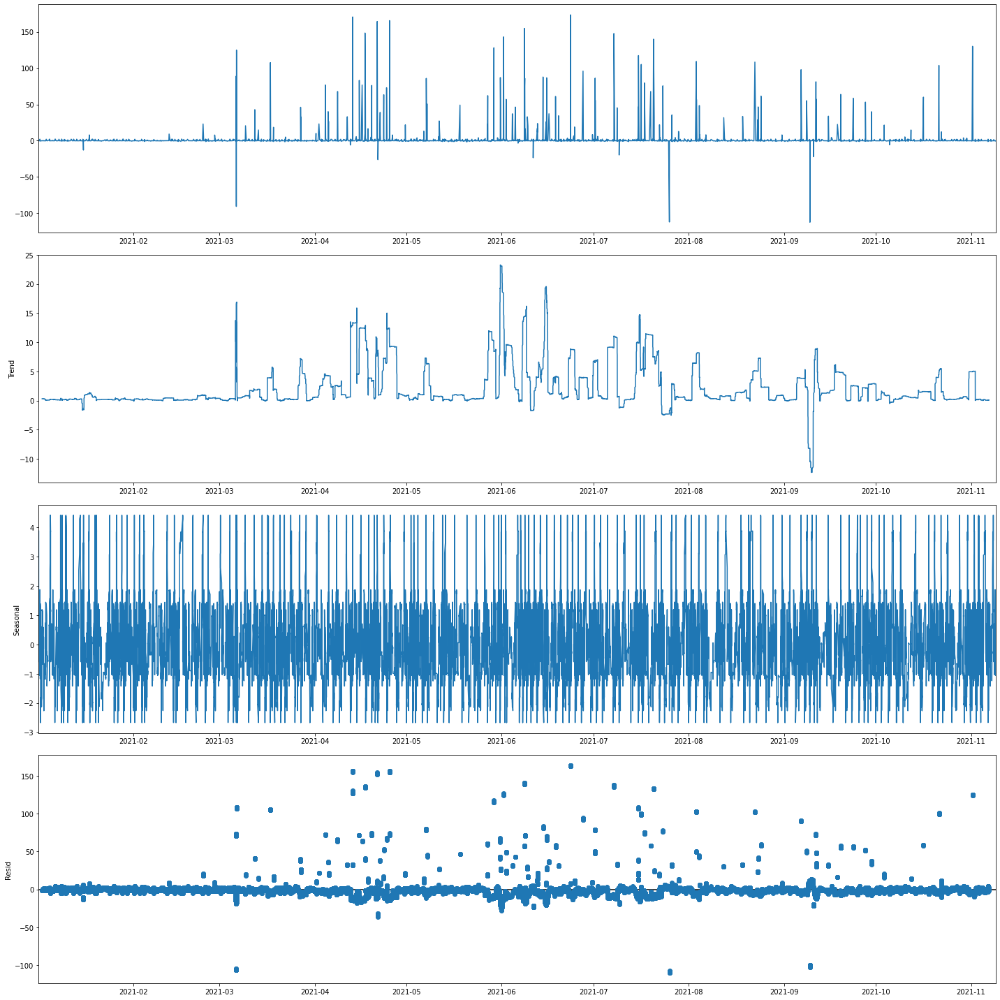

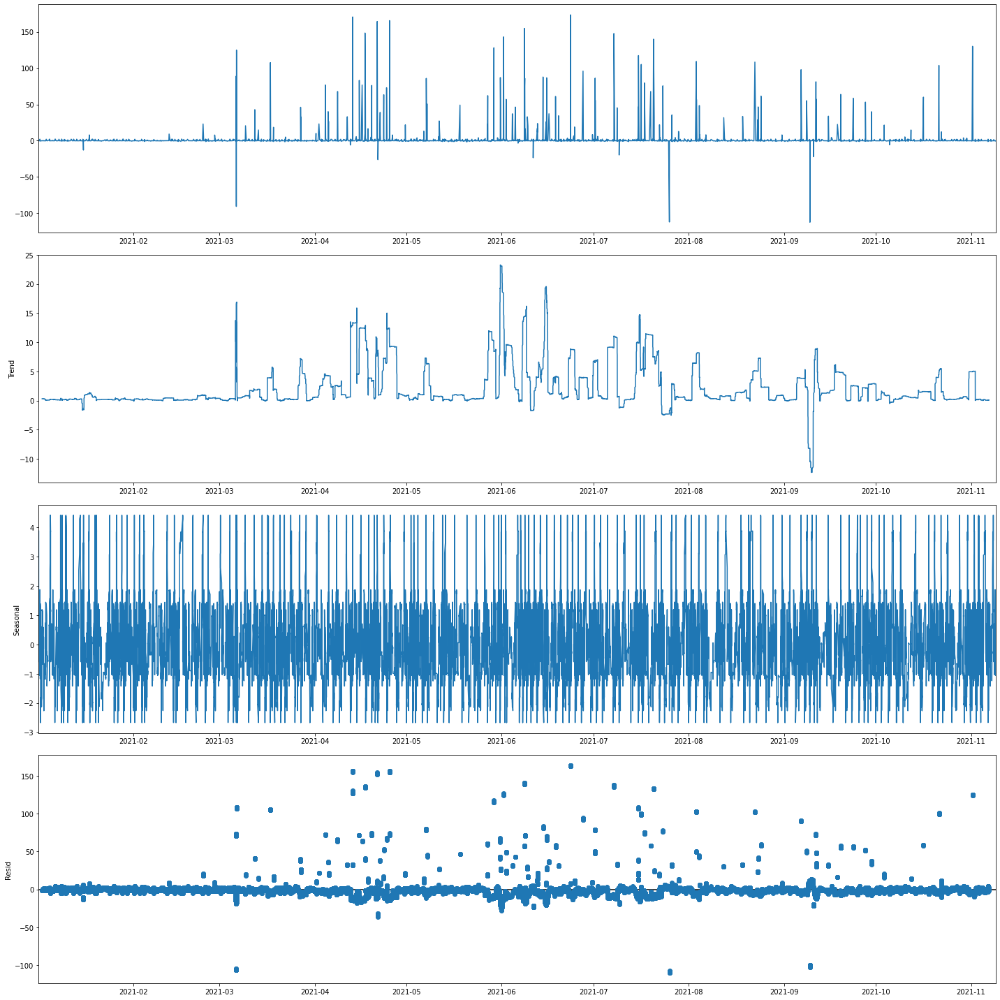

In [25]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20,20)

decompose_result_mult = seasonal_decompose(x=time_df_test, model="additive", period=365)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

Add the seasonal component to the dataframe

In [26]:
df_out= time_df
df_out['seasonal']=seasonal
df_out.head(2)

,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1,seasonal
time,,,,,,,,,,
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273,False,3.879082
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300,False,2.623924


Next, the seasonal component will be removed from the previously identified extreme values (indicator1 =true).

In [27]:
# remove the seasonal component from extreme points to obtain new values, these will be later testing
df_out['remove_seasonal'] = df_out['residuals']
df_out['remove_seasonal'] = np.where(df_out['indicator1']=='True',df_out['residuals']-df_out['seasonal'], df_out['remove_seasonal'])
df_out.head(2)

,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1,seasonal,remove_seasonal
time,,,,,,,,,,,
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273,False,3.879082,-0.099964
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300,False,2.623924,-0.099964


A further test will be done to see if these values are still extreme after the seasonal component was removed

In [28]:
# Test to see if the values would still be extreme if seasonality were removed
df_out['indicator2']='False'
df_out['indicator2']=np.where(((df_out.remove_seasonal>df_out.upper_bound) | (df_out.remove_seasonal<df_out.lower_bound)),'True', df_out['indicator2'])
df_out.head(2)

,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1,seasonal,remove_seasonal,indicator2
time,,,,,,,,,,,,
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273,False,3.879082,-0.099964,False
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300,False,2.623924,-0.099964,False


In [29]:
df_out['indicator2'].value_counts()

False    46997
True       179
Name: indicator2, dtype: int64

### **Step 5: Calculate the adjusted values**

Remove the seasonal componenet for extreme values, whereby upon the removal of the seasonal component, the values are no longer extreme. 

In [30]:
# Flag only values that are extreme and that on removal of the seasonal component, doesn’t go outside the confidence interval
df_out['adjested_values'] = df_out['residuals']
df_out['adjested_values'] = np.where(df_out['indicator2']=='False', df_out['remove_seasonal'], df_out['adjested_values'])
df_out.head(2)

,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1,seasonal,remove_seasonal,indicator2,adjested_values
time,,,,,,,,,,,,,
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273,False,3.879082,-0.099964,False,-0.099964
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300,False,2.623924,-0.099964,False,-0.099964


### **Step 6: Anomaliy detectoin**

Adjusted values are defined as anomalous if there are outside the confidence intervals.

In [31]:
df_out['anomaly']='False'
df_out['anomaly']=np.where(((df_out.adjested_values>df_out.upper_bound) | (df_out.adjested_values<df_out.lower_bound)),'True', df_out['anomaly'])
df_out.head(2)

,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1,seasonal,remove_seasonal,indicator2,adjested_values,anomaly
time,,,,,,,,,,,,,,
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007345,-4.207273,False,3.879082,-0.099964,False,-0.099964,False
2021-01-01 01:20:00,0,0.099964,6990,-0.099964,2021-01-01,4.107309,4.007319,-4.207300,False,2.623924,-0.099964,False,-0.099964,False


Below is a graph of the anomalous points determined by the algorithm.

In [32]:
px.bar(df_out.anomaly.value_counts().reset_index(),
       x='index', y='anomaly',
       color=["lightgreen", "#CB4335"], color_discrete_map="identity",
       title = 'Figure 3.5: Count of Anomolous Points vs. Non-anomolous Points',
       labels={"index": "Classification",
               "anomaly": "Count of Anomolous Points"},
       height=300, width=500)

### **Step 7: Lengh of Anamaly**
The final step will be to determine how long each pv system is producing an anomalous output for.

In [33]:
final_output= df_out[df_out['anomaly'] =='True']

mask = final_output['anomaly'].eq('True')
final_output['subgrps'] = (~mask).cumsum()[mask]
g = mask.groupby([final_output['ss_id'], final_output['subgrps']])
dupes = final_output.duplicated(subset=['ss_id', 'subgrps'])
final_output['duration'] = g.transform('sum').mask(dupes).fillna(0)

final_output

<ipython-input-33-c3ec812d43a7>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-33-c3ec812d43a7>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1,seasonal,remove_seasonal,indicator2,adjested_values,anomaly,subgrps,duration
time,,,,,,,,,,,,,,,,
2021-01-15 15:00:00,0,12.910838,9960,-12.910838,2021-01-15,14.936688,17.058167,-12.815210,True,1.381624,-14.292462,True,-12.910838,True,0,1.0
2021-02-14 00:20:00,0,0.100101,27023,-0.100101,2021-02-14,1.839866,3.872090,0.192359,True,-0.043755,-0.056346,True,-0.100101,True,0,1.0
2021-02-14 02:20:00,0,0.099975,26804,-0.099975,2021-02-14,1.839866,3.872090,0.192359,True,0.024039,-0.124014,True,-0.099975,True,0,1.0
2021-02-14 03:45:00,0,0.102689,9480,-0.102689,2021-02-14,1.839866,3.872090,0.192359,True,1.044111,-1.146800,True,-0.102689,True,0,1.0
2021-02-14 06:10:00,0,0.099975,7190,-0.099975,2021-02-14,1.839866,3.872090,0.192359,True,3.521356,-3.621331,True,-0.099975,True,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-02 08:50:00,5,2.952627,26827,2.047373,2021-11-02,2.189632,1.570716,-2.808548,True,0.080635,1.966738,True,2.047373,True,0,0.0
2021-11-02 10:25:00,28,28.618916,27003,-0.618916,2021-11-02,2.189632,4.237005,-0.142259,True,0.995499,-1.614415,True,-0.618916,True,0,1.0
2021-11-04 08:55:00,6,3.998914,7393,2.001086,2021-11-04,2.038098,1.941278,-2.134919,True,0.046358,1.954728,True,2.001086,True,0,1.0


Filtering for anomolous outputs that last for more than one period.

In [34]:
anomaly = final_output[final_output['duration']>1]
anomaly

,generation_wh,predict,ss_id,residuals,date_ci,CI,upper_bound,lower_bound,indicator1,seasonal,remove_seasonal,indicator2,adjested_values,anomaly,subgrps,duration
time,,,,,,,,,,,,,,,,
2021-02-14 09:25:00,0,0.100143,7550,-0.100143,2021-02-14,1.839866,3.872090,0.192359,True,0.616219,-0.716362,True,-0.100143,True,0,2.0
2021-02-14 10:30:00,9,6.967776,16483,2.032224,2021-02-14,1.839866,1.843627,-1.836104,True,-0.294829,2.327053,True,2.032224,True,0,13.0
2021-03-06 10:30:00,89,-0.003761,27004,89.003761,2021-03-06,149.946827,59.381680,-240.511974,True,0.956704,88.047058,True,89.003761,True,0,2.0
2021-03-06 11:25:00,47,137.565147,26771,-90.565147,2021-03-06,149.946827,238.950589,-60.943066,True,-1.054932,-89.510215,True,-90.565147,True,0,3.0
2021-03-22 12:25:00,138,132.909548,10548,5.090452,2021-03-22,5.807905,4.303289,-7.312521,True,-1.925834,7.016286,True,5.090452,True,0,2.0
2021-04-21 09:55:00,282,117.688732,7202,164.311268,2021-04-21,149.255378,149.259140,-149.251617,True,2.534467,161.776801,True,164.311268,True,0,19.0
2021-04-21 15:35:00,68,68.111248,7495,-0.111248,2021-04-21,149.255378,313.566647,15.055890,True,-0.101718,-0.009530,True,-0.111248,True,0,2.0
2021-04-21 15:35:00,68,68.111248,7844,-0.111248,2021-04-21,149.255378,313.566647,15.055890,True,0.946535,-1.057783,True,-0.111248,True,0,2.0
2021-05-12 12:55:00,33,33.586413,26776,-0.586413,2021-05-12,2.846640,5.115030,-0.578250,True,0.668730,-1.255143,True,-0.586413,True,0,2.0
